In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
import os

images_num = 0
image_names_dict = {}

for dir_name, _, file_names in os.walk('../data/input/deforestation_in_ukraine'):
    for file in file_names:
        if file.endswith('_TCI.jp2'):
            images_num += 1 
            if dir_name not in image_names_dict:
                image_names_dict[dir_name] = list()
            image_names_dict[dir_name].append(file)

print(images_num)
#image_names_dict

50


In [5]:
image_paths_list = [os.path.join(dir_name, file) for dir_name, file_names in image_names_dict.items() for file in file_names]
image_paths_list

['../data/input/deforestation_in_ukraine\\S2A_MSIL1C_20160212T084052_N0201_R064_T36UYA_20160212T084510\\S2A_MSIL1C_20160212T084052_N0201_R064_T36UYA_20160212T084510.SAFE\\GRANULE\\L1C_T36UYA_A003350_20160212T084510\\IMG_DATA\\T36UYA_20160212T084052_TCI.jp2',
 '../data/input/deforestation_in_ukraine\\S2A_MSIL1C_20160330T082542_N0201_R021_T36UYA_20160330T082810\\S2A_MSIL1C_20160330T082542_N0201_R021_T36UYA_20160330T082810.SAFE\\GRANULE\\L1C_T36UYA_A004022_20160330T082810\\IMG_DATA\\T36UYA_20160330T082542_TCI.jp2',
 '../data/input/deforestation_in_ukraine\\S2A_MSIL1C_20160405T085012_N0201_R107_T36UYA_20160405T085012\\S2A_MSIL1C_20160405T085012_N0201_R107_T36UYA_20160405T085012.SAFE\\GRANULE\\L1C_T36UYA_A004108_20160405T085012\\IMG_DATA\\T36UYA_20160405T085012_TCI.jp2',
 '../data/input/deforestation_in_ukraine\\S2A_MSIL1C_20160502T083602_N0201_R064_T36UYA_20160502T084425\\S2A_MSIL1C_20160502T083602_N0201_R064_T36UYA_20160502T084425.SAFE\\GRANULE\\L1C_T36UYA_A004494_20160502T084425\\IMG_DAT

In [7]:
import rasterio
from rasterio.plot import reshape_as_image

# Indexes of images from image_paths_list
read_image_indexes = list(range(24))
images = []

def read_raster_image(path):
    with rasterio.open(path, "r", driver='JP2OpenJPEG') as src:
        raster_image = src.read()
        raster_meta = src.meta
    raster_image = reshape_as_image(raster_image)
    return raster_image, raster_meta

for i in read_image_indexes:
    image_path = image_paths_list[i]
    image, meta = read_raster_image(image_path)
    images.append(image)
    print(f'Raster image {i} was read, shape: {image.shape}')

Raster image 0 was read, shape: (10980, 10980, 3)
Raster image 1 was read, shape: (10980, 10980, 3)
Raster image 2 was read, shape: (10980, 10980, 3)
Raster image 3 was read, shape: (10980, 10980, 3)
Raster image 4 was read, shape: (10980, 10980, 3)
Raster image 5 was read, shape: (10980, 10980, 3)
Raster image 6 was read, shape: (10980, 10980, 3)
Raster image 7 was read, shape: (10980, 10980, 3)
Raster image 8 was read, shape: (10980, 10980, 3)
Raster image 9 was read, shape: (10980, 10980, 3)
Raster image 10 was read, shape: (10980, 10980, 3)
Raster image 11 was read, shape: (10980, 10980, 3)
Raster image 12 was read, shape: (10980, 10980, 3)
Raster image 13 was read, shape: (10980, 10980, 3)
Raster image 14 was read, shape: (10980, 10980, 3)
Raster image 15 was read, shape: (10980, 10980, 3)
Raster image 16 was read, shape: (10980, 10980, 3)
Raster image 17 was read, shape: (10980, 10980, 3)
Raster image 18 was read, shape: (10980, 10980, 3)
Raster image 19 was read, shape: (10980, 

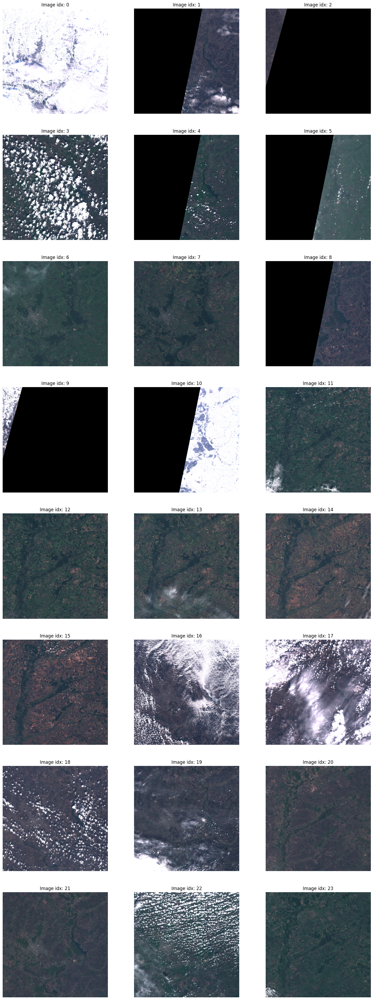

In [9]:
import cv2
import matplotlib.pyplot as plt

dscale_images = [cv2.resize(image, None, fx=0.1, fy=0.1, interpolation=cv2.INTER_AREA) for image in images]

fig, ax = plt.subplots(ncols=3, nrows=8, figsize=(18, 48))
ax = ax.flatten()

for i in range(len(dscale_images)):
    ax[i].set_title(f'Image idx: {i}')
    ax[i].imshow(dscale_images[i])
    ax[i].axis('off')
    
plt.show()

In [10]:
import torch
import kornia as K
from kornia_moons.viz import draw_LAF_matches

class LoFTR_Matcher:
    # image_size - size of scaled images used in LoFTR, if it is None then the source images
    # or images with the calculated scale are used. For best matching performance,
    # the source image size should be a multiple of image_size.
    def __init__(self, image_size=None, device=None):
        self.image_size = image_size
        self.device = device if device else K.utils.get_cuda_device_if_available()
        self.matcher = K.feature.LoFTR(pretrained='outdoor').eval().to(self.device)
        
    def __call__(self, image0, image1, confidence_min=0.8, accurate=False):
        image0 = self._convert_image(image0)
        image1 = self._convert_image(image1)
        
        input = {            
            'image0': K.color.rgb_to_grayscale(image0), # LoFTR works on grayscale images only
            'image1': K.color.rgb_to_grayscale(image1)
        }        
        with torch.inference_mode():
            corresp = self.matcher(input)

        # Select key points that have a confidence greater than confidence_min
        mask = corresp['confidence'] > confidence_min
        indices = torch.nonzero(mask, as_tuple=True)               
        keypoints0 = corresp['keypoints0'][indices].cpu().numpy()
        keypoints1 = corresp['keypoints1'][indices].cpu().numpy()
        confidence = corresp['confidence'][indices].cpu().numpy()

        # From confidence key points we select inlier points relative to the fundamental matrix
        fmat_method = cv2.USAC_ACCURATE if accurate else cv2.USAC_MAGSAC
        try:
            fmat, inliers = cv2.findFundamentalMat(keypoints0, keypoints1, fmat_method, 1, 0.99, 100000)
            inliers = inliers > 0
        except:
            inliers = None        
        
        return {
            'image0' : image0,
            'image1' : image1,
            'keypoints0': keypoints0,
            'keypoints1': keypoints1,
            'confidence': confidence,
            'inliers': inliers
        }        

    @staticmethod
    def draw_matches(match_dict):        
        output_fig = draw_LAF_matches(
            K.feature.laf_from_center_scale_ori(
                torch.from_numpy(match_dict['keypoints0']).view(1, -1, 2),
                torch.ones(match_dict['keypoints0'].shape[0]).view(1, -1, 1, 1),
                torch.ones(match_dict['keypoints0'].shape[0]).view(1, -1, 1),
            ),
            K.feature.laf_from_center_scale_ori(
                torch.from_numpy(match_dict['keypoints1']).view(1, -1, 2),
                torch.ones(match_dict['keypoints1'].shape[0]).view(1, -1, 1, 1),
                torch.ones(match_dict['keypoints1'].shape[0]).view(1, -1, 1),
            ),
            torch.arange(match_dict['keypoints0'].shape[0]).view(-1, 1).repeat(1, 2),
            K.tensor_to_image(match_dict['image0']),
            K.tensor_to_image(match_dict['image1']),
            match_dict['inliers'],
            draw_dict={
                'inlier_color': (0.2, 1, 0.2),
                'tentative_color': (1, 0.1, 0.1),
                'feature_color': (0.2, 0.5, 1),
                'vertical': False}
        )
        return output_fig        
        
    def _convert_image(self, image):
        SIZE_MAX = 1280 # LoFTR has out of memory for large images
        image = K.utils.image_to_tensor(image)
        image = image.float().unsqueeze(dim=0).to(self.device) / 255.0
        if self.image_size:
            image = K.geometry.resize(image, self.image_size, interpolation='area')
        elif max(image.shape[-1], image.shape[-2]) > SIZE_MAX:
            image = K.geometry.resize(image, SIZE_MAX, side='long', interpolation='area')
        return image

In [11]:
# For best matching performance, an input image size should be a multiple of IMAGE_SIZE
IMAGE_SIZE = (1098, 1098)

matcher = LoFTR_Matcher(IMAGE_SIZE)

def outputs_matches(image0, image1, conf=0.8, accurate=False):    
    corresp = matcher(image0, image1, conf, accurate)
    
    # Перевірка, чи є інлієри
    if corresp['inliers'] is None:
        print("No inliers found. Skipping these images.")
        return
    
    # Якщо інлієри є, обчислюємо кількість і виводимо результат
    keypoints_num = len(corresp['inliers'])
    inliers_num = sum(corresp['inliers'])[0]
    ratio = inliers_num / float(keypoints_num)
    
    print(f'Key points: {keypoints_num}, Inlier points: {inliers_num}, Ratio: {ratio:.2f}')    
    
    # Візуалізація збігів
    matcher.draw_matches(corresp)


Processing images 0 and 6...
Key points: 453, Inlier points: 406, Ratio: 0.90
Processing images 0 and 16...
No inliers found. Skipping these images.
Processing images 0 and 18...
Key points: 75, Inlier points: 70, Ratio: 0.93
Processing images 6 and 16...
Key points: 513, Inlier points: 435, Ratio: 0.85
Processing images 6 and 18...
Key points: 1520, Inlier points: 1337, Ratio: 0.88
Processing images 16 and 18...
Key points: 927, Inlier points: 791, Ratio: 0.85


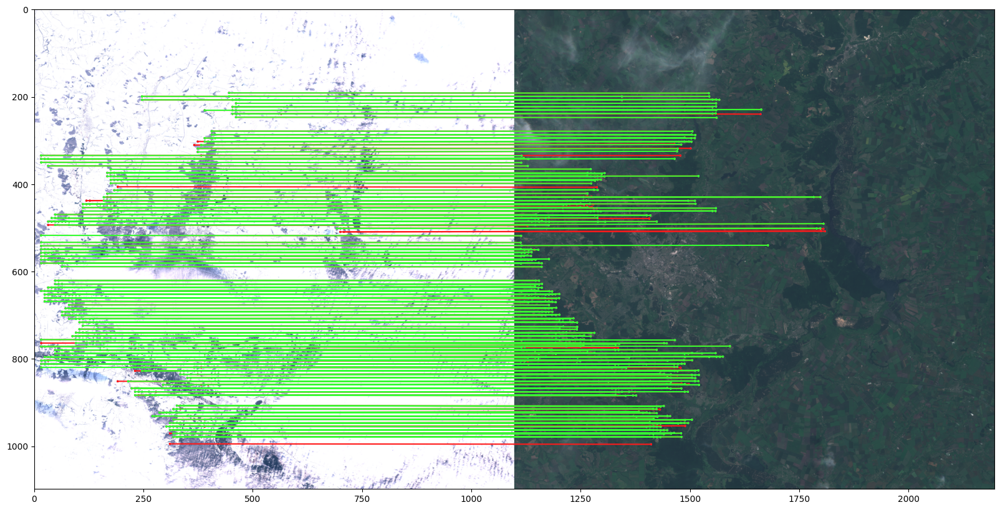

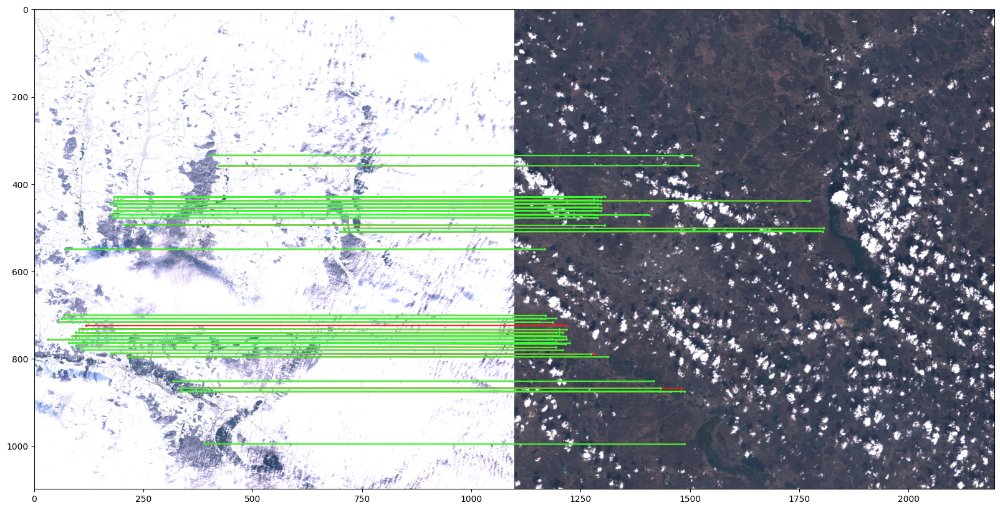

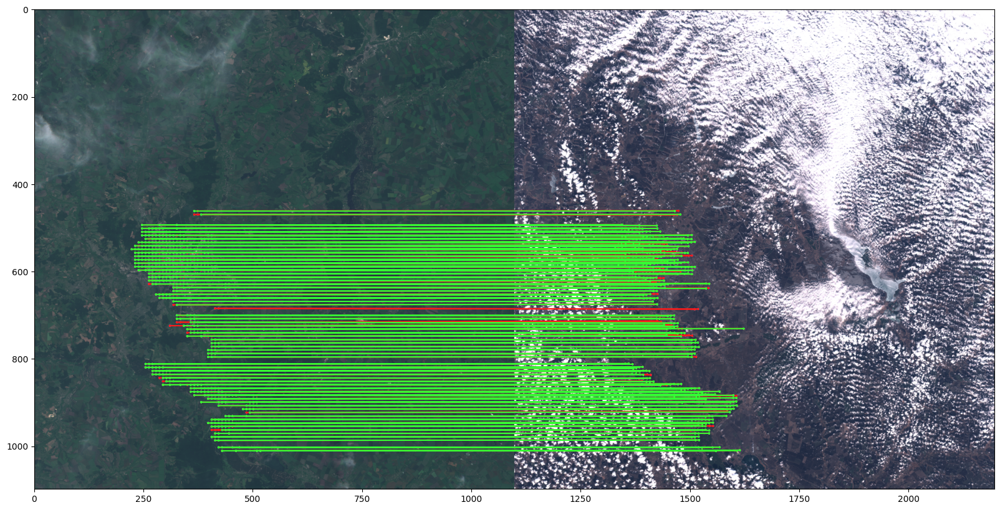

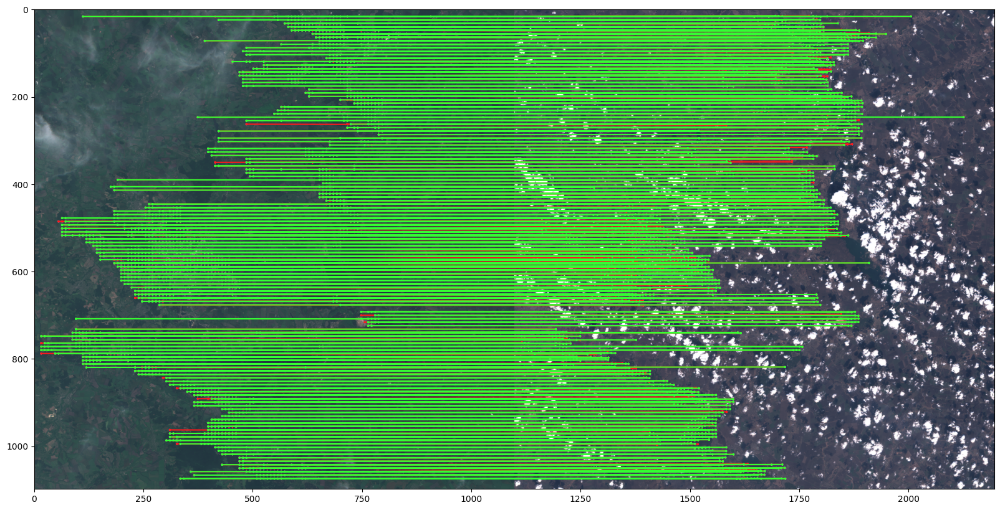

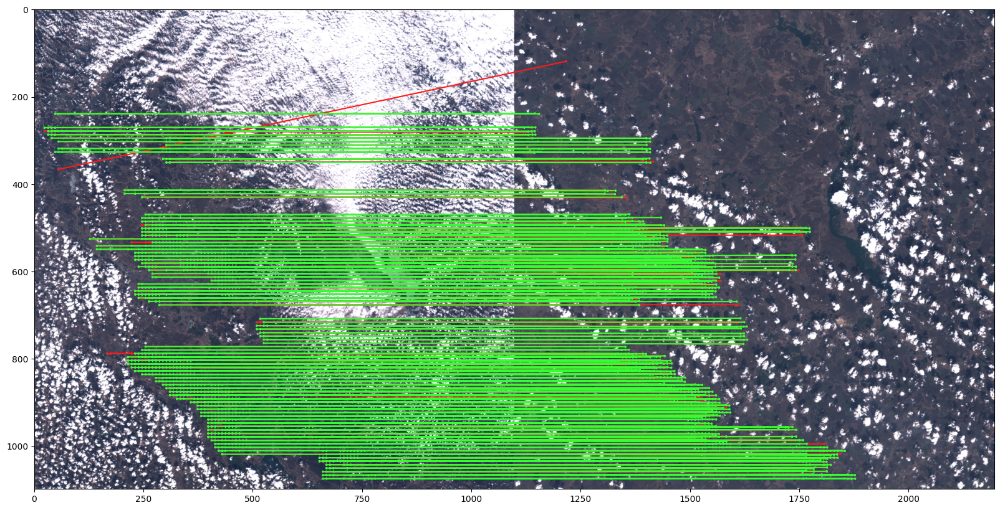

In [12]:
img_ids = [0, 6, 16, 18]

for i in range(len(img_ids)):
    for j in range(i + 1, len(img_ids)):
        idx1 = img_ids[i]
        idx2 = img_ids[j]
        print(f"Processing images {idx1} and {idx2}...")
        outputs_matches(images[idx1], images[idx2], conf=0.9)


In [ ]:
# Define the directory to save images
output_dir = '../data/prepared_images/'

# Ensure the directory exists
os.makedirs(output_dir, exist_ok=True)

# Save images
for idx, image in enumerate(images):
    # Define the filename
    filename = os.path.join(output_dir, f'image_{idx}.png')
    
    # Convert the image to the correct format (uint8) if necessary
    if image.dtype != np.uint8:
        image = (255 * image).astype(np.uint8)  # Assuming the image is normalized to [0, 1]

    # Save the image using OpenCV
    cv2.imwrite(filename, image)
    print(f'Saved: {filename}')


Saved: ../data/prepared_images/image_0.png
Saved: ../data/prepared_images/image_1.png
Saved: ../data/prepared_images/image_2.png
Saved: ../data/prepared_images/image_3.png
Saved: ../data/prepared_images/image_4.png
Saved: ../data/prepared_images/image_5.png
Saved: ../data/prepared_images/image_6.png
Saved: ../data/prepared_images/image_7.png
Saved: ../data/prepared_images/image_8.png
Saved: ../data/prepared_images/image_9.png
Saved: ../data/prepared_images/image_10.png
Saved: ../data/prepared_images/image_11.png
Saved: ../data/prepared_images/image_12.png
Saved: ../data/prepared_images/image_13.png
